# Lake drainage vvs

In [1]:
# Load libraries
import sys
import sys
sys.path.append("../../../xapres_package/")
import ApRESDefs
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker 

import xarray as xr
import importlib
import pandas as pd
import math
from datetime import datetime, timedelta, date
from scipy.stats import linregress
from helpers import *

importlib.reload(ApRESDefs)
xa = ApRESDefs.xapres(loglevel='debug')

DEBUG    20:10:58 	 ApRESDefs.py @function _setup_logging line 615 - Stream logging level set to DEBUG
DEBUG    20:10:58 	 ApRESDefs.py @function _setup_logging line 616 - Add console handler to logger
DEBUG    20:10:58 	 ApRESDefs.py @function _setup_logging line 629 - File logging level set to DEBUG


In [2]:
# Load data
ds_11 = reload("A101")
ds_11 = ds_11.isel(time=range(20,len(ds_11.time))) # trim first few bursts, which were tests

ds_13 = reload("A103_fixed")
ds_13 = ds_13.isel(time=range(60,len(ds_13.time))) # trim first few bursts, which were tests

ds_14 = reload("A104")
ds_14 = ds_14.isel(time=range(50,len(ds_14.time))) # trim first few bursts, which were tests



In [3]:
from dask.distributed import Client

client = Client("tcp://127.0.0.1:34715")
client

<Client: 'tcp://127.0.0.1:34715' processes=4 threads=16, memory=125.80 GiB>

In [4]:
def strain_metrics(ds, win_cor, step, lag, noise_floor):
    # This function, given a window, and step, gives a total percentage of data that has high coherence
    b1 = ds.isel(time=range(0,len(ds)-lag))
    b2 = ds.isel(time=range(lag,len(ds)))
    dz, co, phi = xa.generate_range_diff(b1,b2,win_cor,step,None,0,0.95)
    dz=dz.assign(coherence=(['time','profile_range'],co))
    dz_new = dz.where(abs(dz.coherence) > 0.95).drop_duplicates('time')

    vv = dz_new.range_diff / dz_new.time_diff * 31536000
    vv_err = dz_new.err / dz_new.time_diff * 31536000
    fit=vv.where(vv.profile_range <=noise_floor).polyfit('profile_range',1,full=True)
    r2 = 1-fit.polyfit_residuals/((vv.where(vv.profile_range <=noise_floor)-vv.where(vv.profile_range <=noise_floor).mean())**2).sum(dim='profile_range')
    
    slope = fit.polyfit_coefficients.sel(degree=1)*vv.profile_range+fit.polyfit_coefficients.sel(degree=0)
    residual = vv-slope
    residual = residual.where(residual.profile_range <=noise_floor,drop=True)
    slope_errs = np.sqrt((1/(len(residual.profile_range)-2))*(((residual**2).sum(dim='profile_range'))/((residual.profile_range - residual.profile_range.mean())**2).sum()))

    return np.count_nonzero(abs(co)>0.95)/np.count_nonzero(co),np.mean(r2).values,[vv,vv_err,fit,r2,slope_errs]

def optimal_window_and_leapfrog(ds,noise_floor):
    max_score = 0
    windows = np.arange(20,90,20)
    lags = np.round(np.logspace(0,3,4)).astype('int')
    co_mat = np.zeros((len(windows),len(lags)))
    r2_mat = np.zeros((len(windows),len(lags)))
    for i in range(len(windows)):
        step = windows[i] # earlier experiments show step doesn't change results by much
        #for step in [10,20,40,80]:
        #    if step <= window:
        for j in range(len(lags)):
            count,r2,res = strain_metrics(ds, windows[i], step,lags[j],noise_floor)
            print(f"Window {windows[i]}, lag {lags[j]} -> frac high co {count:.2}, r2 {r2:.2}")
            co_mat[i,j] = count
            r2_mat[i,j]=r2
            # mean coherence not relevant I think
            temp_score = count+r2
            if temp_score > max_score:
                max_score = temp_score
                to_return = windows[i],lags[j],res
            
    fig, axs = plt.subplots(ncols=2,figsize=(15,5))
    plt0 = axs[0].pcolormesh(100*co_mat)
    plt.colorbar(plt0,ax=axs[0],label='fraction of data with |coherence|>0.95')
    axs[0].set_xticks(np.arange(co_mat.shape[1]) + 0.5, minor=False)
    axs[0].set_yticks(np.arange(co_mat.shape[0]) + 0.5, minor=False)
    axs[0].set_xticklabels(lags)
    axs[0].set_yticklabels(windows)
    axs[0].set_ylabel('Correlation window size [points included]')
    axs[0].set_xlabel('Lag between bursts [num. bursts seperated]')
    axs[0].set_title('fraction of data with high coherence')

    plt1 = axs[1].pcolormesh(r2_mat)
    plt.colorbar(plt1,ax=axs[1],label='Average r^2 of linear strain fits')
    axs[1].set_xticks(np.arange(r2_mat.shape[1]) + 0.5, minor=False)
    axs[1].set_yticks(np.arange(r2_mat.shape[0]) + 0.5, minor=False)
    axs[1].set_xticklabels(lags)
    axs[1].set_yticklabels(windows)
    axs[1].set_ylabel('Correlation window size [points included]')
    axs[1].set_xlabel('Lag between bursts [num. bursts seperated]')
    axs[1].set_title('Mean strain rate fit r-squared')

    return to_return
    
def plot_strain_fit(res,xlims=None,ylims=None):
    vv = res[0]
    vv_err = res[1]
    fit=res[2]
    r2 = res[3]
    slope_err = res[4]
    fig, ax = plt.subplots(figsize=(10,5))
    ax.errorbar(fit.time.values,fit.polyfit_coefficients.sel(degree=1).values,yerr=slope_err.values,linestyle='None',marker='.',ecolor='k')
    if ylims:
        ax.set_ylim(ylims)
    ax.set_ylabel('Strain rate [y$^{-1}$]')
    ax.set_title('Strain fitting results')
    ax.set_xlabel('Date')
    plt.yscale('symlog',linthresh=1e-1)

    fig1, axs_1 = plt.subplots(ncols=10,figsize=(19,5),sharey=True,layout='constrained')
    #fig1.suptitle('Strain fitting (\u03B5\u0307 in 10$^{-3}$ yr$^{-1}$)',fontsize=18)
    vv_times = np.arange(math.ceil(0.05*len(vv.time)),len(vv.time),len(vv.time)//10)
    for i in range(10):
        time = vv.time.isel(time = vv_times[i]).values
        axs_1[i].errorbar(vv.sel(time = time,method="nearest") ,vv.profile_range,yerr=None,xerr=vv_err.sel(time = time,method="nearest"),marker='.',linestyle='None',zorder=1)
        slope = fit.polyfit_coefficients.sel(degree=1).isel(time=vv_times[i]).values*np.linspace(20,600)+fit.polyfit_coefficients.sel(degree=0).isel(time=vv_times[i]).values

        axs_1[i].plot(slope,np.linspace(20,600),color='r',zorder=2)
        unit = ''#'x10$^{-3}$ yr$^{-1}$'
        #axs_1[plt_count].text(-10,300, f"\u03B5\u0307= {fit.polyfit_coefficients.sel(degree=1).isel(time=i).values*1000:.2g}"+unit,color = 'r',fontsize=14)
        axs_1[i].set_title(f'{time.astype(str)[:10]}')
        if xlims:
            axs_1[i].set_xlim(xlims)
        axs_1[i].set_ylim([20,1400])
        axs_1[i].tick_params(axis='both', which='major', labelsize=14)


    axs_1[0].invert_yaxis()

    axs_1[0].set_ylabel('depth [m]',fontsize=18)
    fig1.supxlabel('vertical velocity [m y$^{-1}$]',fontsize=18)

def plot_vv_2d(res,xlims=None):
    vv = res[0]
    vv_err = res[1]
    fit=res[2]
    r2 = res[3]
    fig, axs = plt.subplots(figsize=(20,10),nrows=2,sharex=True)
    plt1 = vv.plot(ax=axs[0],x='time',cmap='RdBu',vmin=-100,vmax=100)
    axs[0].invert_yaxis()
    axs[0].set_title('Vertical velocity estimate')
    axs[0].set_xlabel('')
    plt1.colorbar.set_label(label='vertical velocity [m y$^{-1}$]', size=14)

    plt2 = vv_err.plot(ax=axs[1],x='time',cmap='Blues')
    axs[1].invert_yaxis()
    axs[1].set_xlabel('Date')
    axs[1].set_title('Vertical velocity error')
    if xlims:
        plt.xlim(xlims)
    plt2.colorbar.set_label(label='vertical velocity error [m y$^{-1}$]', size=14)





## A11

In [5]:
ds_11_drain = ds_11.isel(time=range(4200,5200))
test = custom_profile(ds_11_drain.isel(attenuator_setting_pair=0).chirp,clip_threshold=1.2,min_chirps = 5,start=20000)
time_to_interp = pd.date_range("2022-07-09 12:00", "2022-07-19 12:00", freq="15min")
interp_profiles = test.interp(time=time_to_interp,method='linear')
interp_profiles['doy_decimal'] = interp_profiles.time.dt.dayofyear + (interp_profiles.time.dt.hour / 24) + (interp_profiles.time.dt.minute / 1440) + (interp_profiles.time.dt.second / 86400)


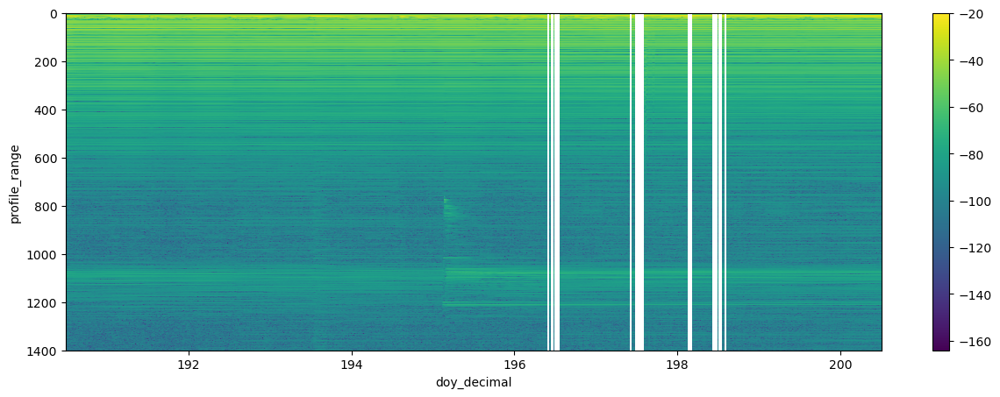

In [6]:
fig, ax = plt.subplots(figsize=(15,5))
xa.dB(interp_profiles).plot(x='doy_decimal')
ax.invert_yaxis()

Text(0.5, 1.0, 'Phase')

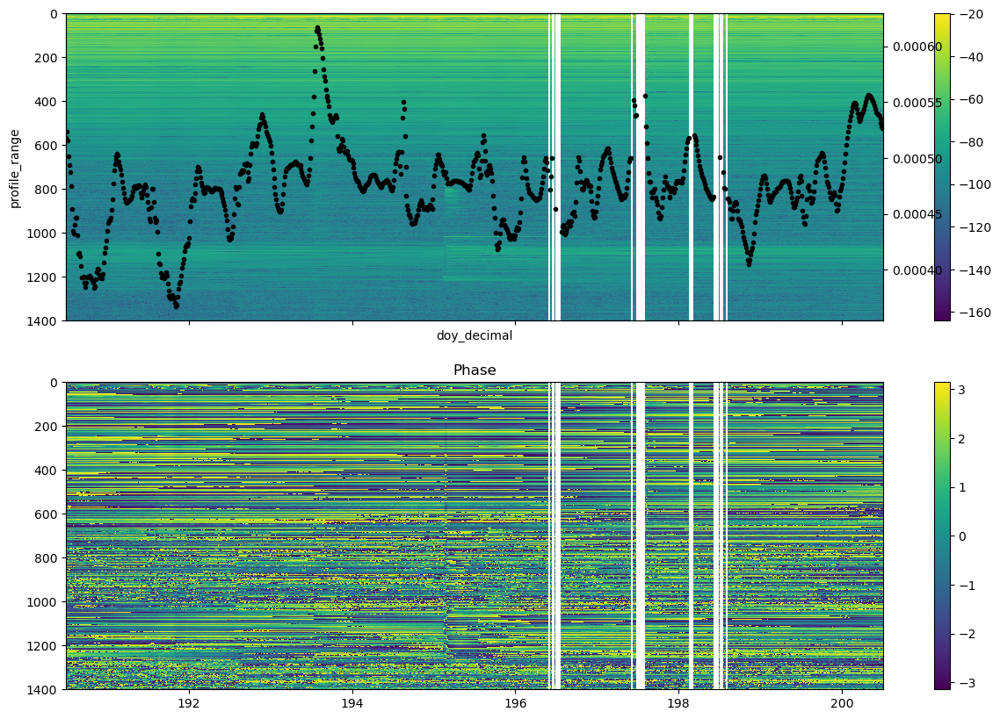

In [7]:
fig, axs = plt.subplots(nrows=2,figsize=(15,10),sharex=True)
fg=xa.dB(interp_profiles).plot(ax=axs[0],x='doy_decimal')
axs[0].invert_yaxis()
ax1 = axs[0].twinx()
abs(interp_profiles).mean(dim='profile_range').plot(ax=ax1,x='doy_decimal',color='k',linestyle='None',marker='.')

phi = -np.angle(interp_profiles).astype(float)
im = axs[1].pcolormesh(interp_profiles.doy_decimal.values,interp_profiles.profile_range.values,phi.T)
axs[1].invert_yaxis()
fig.colorbar(im)
axs[1].set_title('Phase')

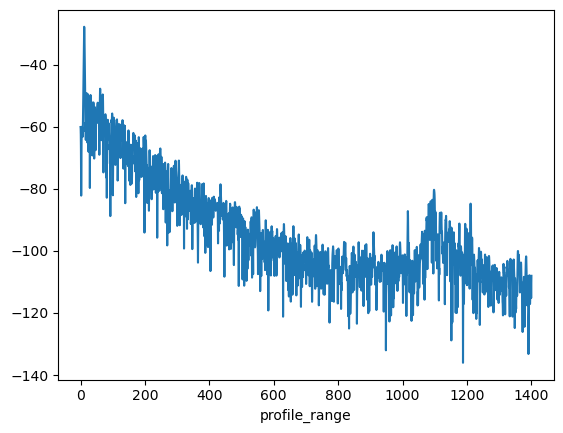

In [8]:
xa.dB(interp_profiles.mean(dim='time')).plot()


Noise floor is around 800 m

In [9]:
noise_floor_location = 800
for i in [20,30,40,50,60,70,80]:
    co_bins = interp_profiles.profile_range[::i].where(interp_profiles.profile_range[::i] <noise_floor_location,drop=True)
    print(f'Bin size of {i} points leads to a total of {len(co_bins)} points in the first {noise_floor_location} m')

Bin size of 20 points leads to a total of 96 points in the first 800 m
Bin size of 30 points leads to a total of 64 points in the first 800 m
Bin size of 40 points leads to a total of 48 points in the first 800 m
Bin size of 50 points leads to a total of 39 points in the first 800 m
Bin size of 60 points leads to a total of 32 points in the first 800 m
Bin size of 70 points leads to a total of 28 points in the first 800 m
Bin size of 80 points leads to a total of 24 points in the first 800 m


Bin size of 50

/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 1 -> frac high co 0.68, r2 0.19


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 2 -> frac high co 0.57, r2 0.26


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 4 -> frac high co 0.54, r2 0.37


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 8 -> frac high co 0.5, r2 0.49


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 24 -> frac high co 0.41, r2 0.7


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 48 -> frac high co 0.37, r2 0.79
Lag 96 -> frac high co 0.34, r2 0.86


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom
/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 192 -> frac high co 0.24, r2 0.93
Lag 288 -> frac high co 0.16, r2 0.95


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


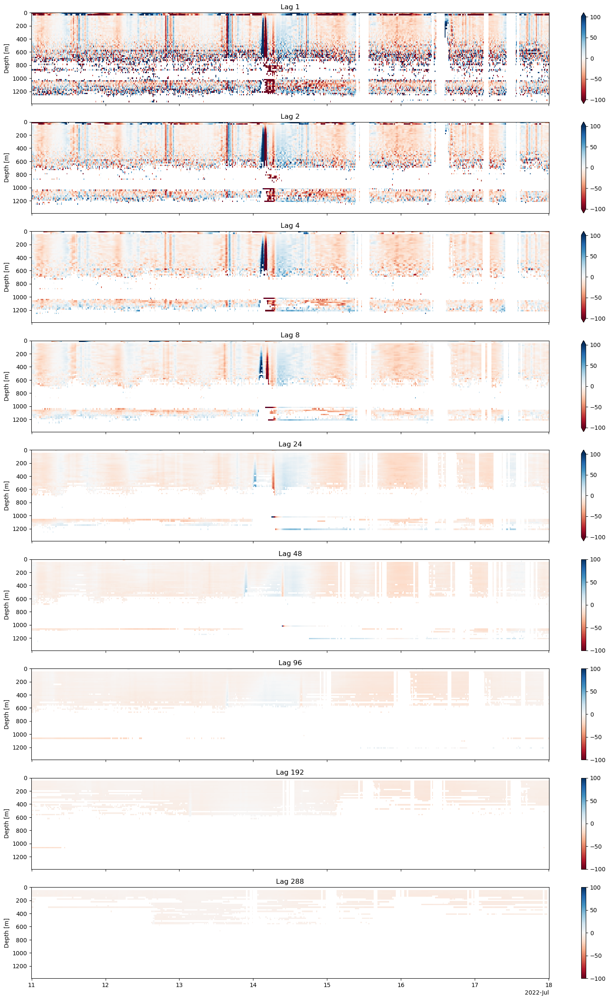

In [10]:
time_lags = [1,2,4,8,24,48,96,192,288] # 15, 30 mins, 1,2,6,12 hours, 1,2,3 days, 1,2 weeks
fig, axs = plt.subplots(figsize=(20,30),nrows=len(time_lags),sharex=True)

for i in range(len(time_lags)):
    count,r2,res = strain_metrics(interp_profiles, 50, 50,time_lags[i],noise_floor_location)
    print(f"Lag {time_lags[i]} -> frac high co {count:.2}, r2 {r2:.2}")
    vv = res[0]
    vv_err = res[1]
    fit=res[2]
    r2 = res[3]
    plt1 = vv.plot(ax=axs[i],x='time',cmap='RdBu',vmin=-100,vmax=100)
    axs[i].invert_yaxis()
    axs[i].set_xlabel('')
    axs[i].set_title(f"Lag {time_lags[i]}")
    #plt1.colorbar.set_label(label='vertical velocity [m y$^{-1}$]', size=14)

In [11]:
count,r2,res = strain_metrics(interp_profiles, 50, 50,4,noise_floor_location)

/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


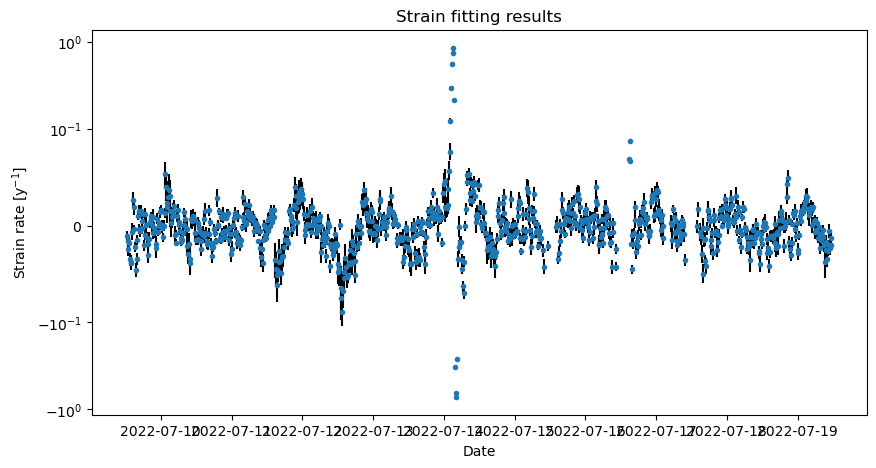

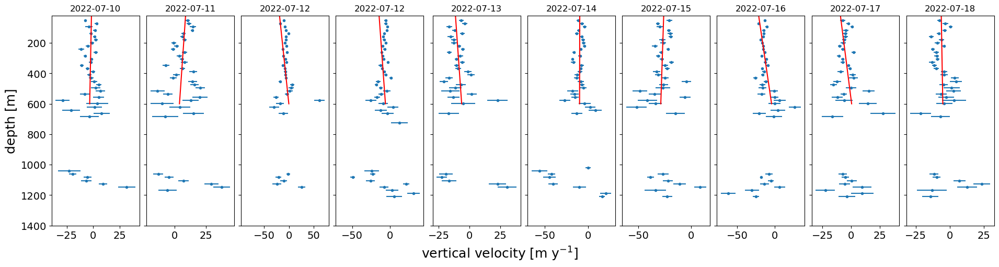

In [12]:
plot_strain_fit(res)

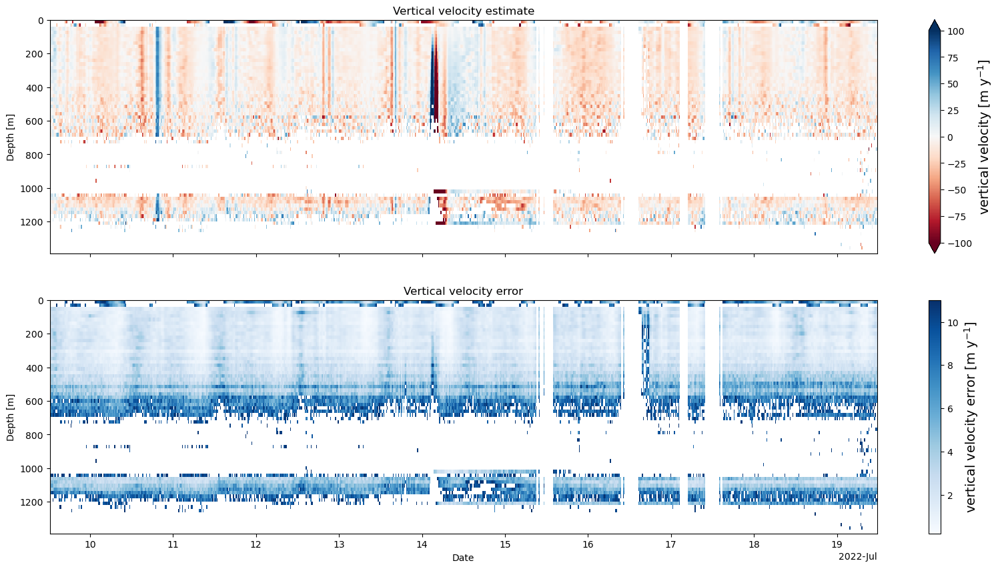

In [13]:
plot_vv_2d(res)

/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom
/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


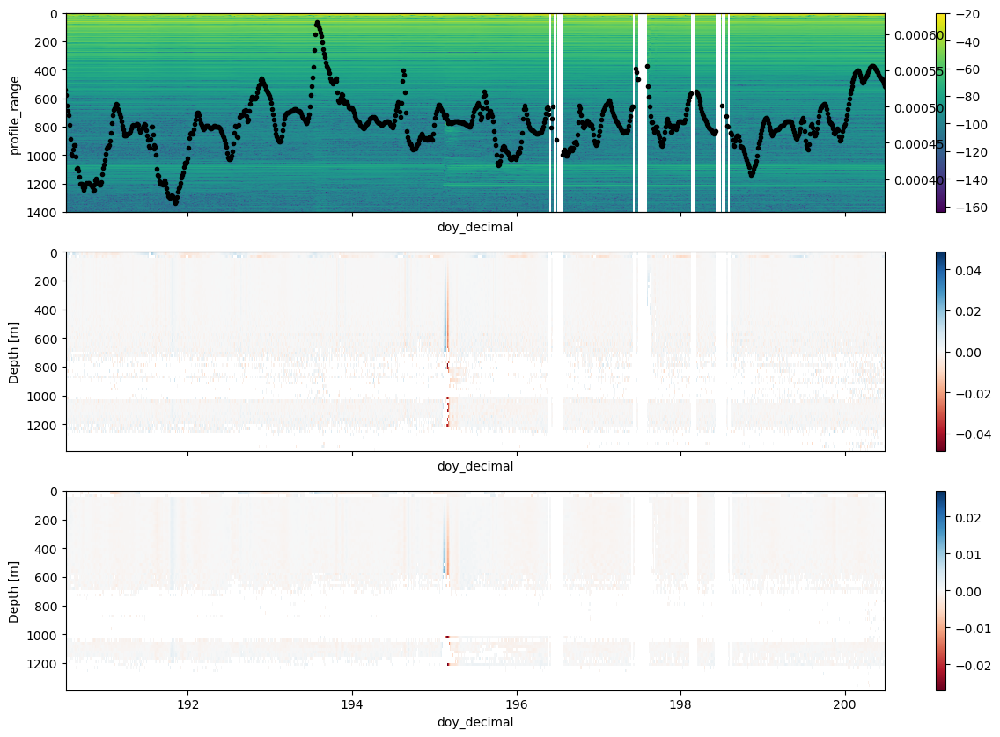

In [22]:
# Look at how this affects displacement estimates
fig, axs = plt.subplots(nrows=3,figsize=(15,10),sharex=True)
xa.dB(interp_profiles).plot(ax=axs[0],x='doy_decimal')
axs[0].invert_yaxis()
axs[0].set_xlim([194,195])

ax1 = axs[0].twinx()
abs(interp_profiles).mean(dim='profile_range').plot(ax=ax1,x='doy_decimal',color='k',linestyle='None',marker='.')

windows = [1,4,96]
labels = ['15 minutes','1 hour','1 day']

for i in range(2):
    count,r2,res = strain_metrics(interp_profiles, 50, 50,windows[i],800)
    vv = res[0]*900/31536000
    vv['doy_decimal'] = vv.time.dt.dayofyear + (vv.time.dt.hour / 24) + (vv.time.dt.minute / 1440) + (vv.time.dt.second / 86400)
    vv.plot(ax=axs[1+i],x='doy_decimal',cmap='RdBu')#,vmin=-100,vmax=100)
    axs[i+1].invert_yaxis()
#plt.xlim([194,195])

In [23]:
ds_11 = reload("A101")
voltage = ds_11.battery_voltage.interp(time=time_to_interp,method='linear').compute()
temp1 = ds_11.temperature_1
true_temp1 = temp1.where(lambda x: x<300, temp1-512).interp(time=time_to_interp,method='linear').compute()

temp2 = ds_11.temperature_2
true_temp2 = temp2.where(lambda x: x<300, temp2-512).interp(time=time_to_interp,method='linear').compute()


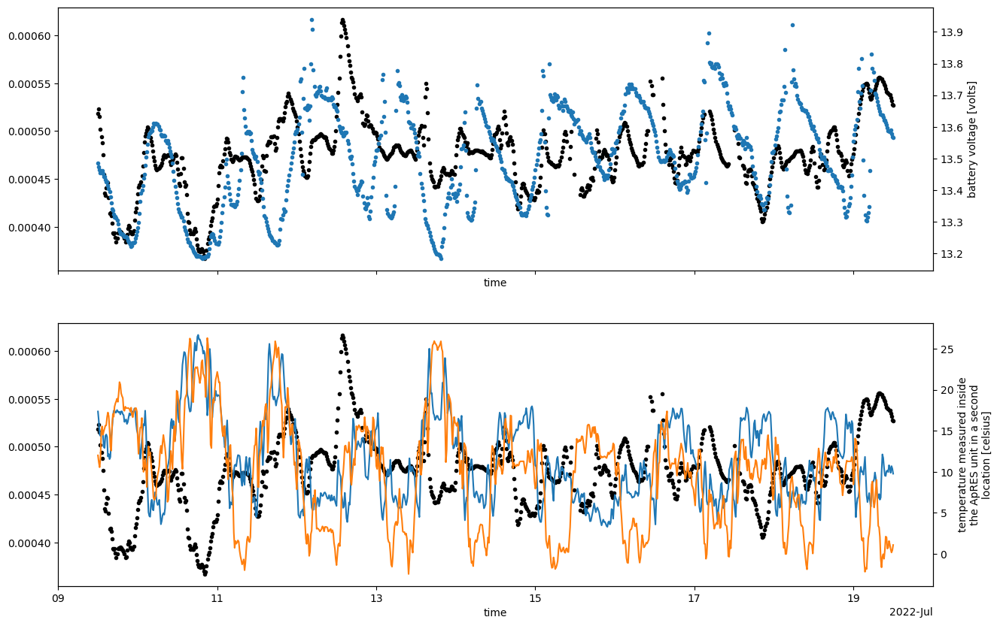

In [24]:
fig, axs = plt.subplots(nrows=2,figsize=(15,10),sharex=True)
abs(interp_profiles).mean(dim='profile_range').plot(ax=axs[0],color='k',linestyle='None',marker='.')
ax1 = axs[0].twinx()
voltage.plot(ax=ax1,linestyle='None',marker='.')

abs(interp_profiles).mean(dim='profile_range').plot(ax=axs[1],color='k',linestyle='None',marker='.')
ax2 = axs[1].twinx()
true_temp1.plot(ax=ax2)
true_temp2.plot(ax=ax2)


Zooming in even closer on lake drainage

In [25]:
ds_11_drain = ds_11.isel(time=range(4200,5200))
time_to_interp = pd.date_range("2022-07-13 12:00", "2022-07-15 00:00", freq="15min")
interp_profiles = test.interp(time=time_to_interp,method='linear')
interp_profiles['doy_decimal'] = interp_profiles.time.dt.dayofyear + (interp_profiles.time.dt.hour / 24) + (interp_profiles.time.dt.minute / 1440) + (interp_profiles.time.dt.second / 86400)


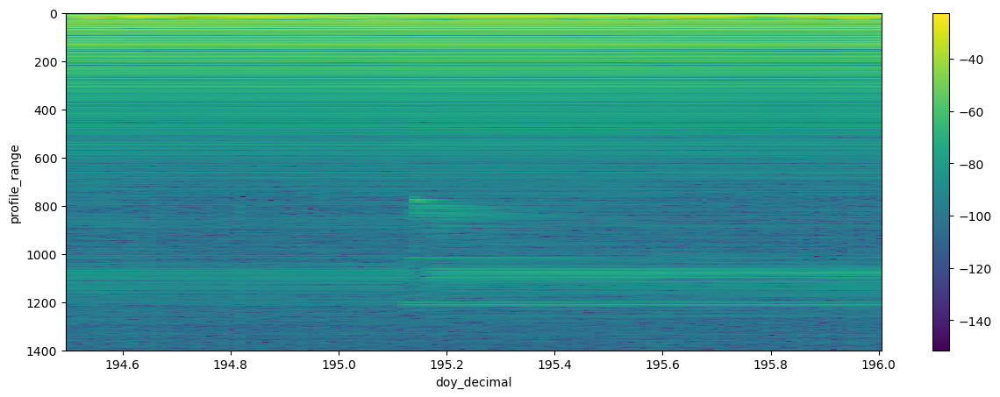

In [26]:
fig, ax = plt.subplots(figsize=(15,5))
xa.dB(interp_profiles).plot(x='doy_decimal')
ax.invert_yaxis()

Text(0.5, 1.0, 'Phase')

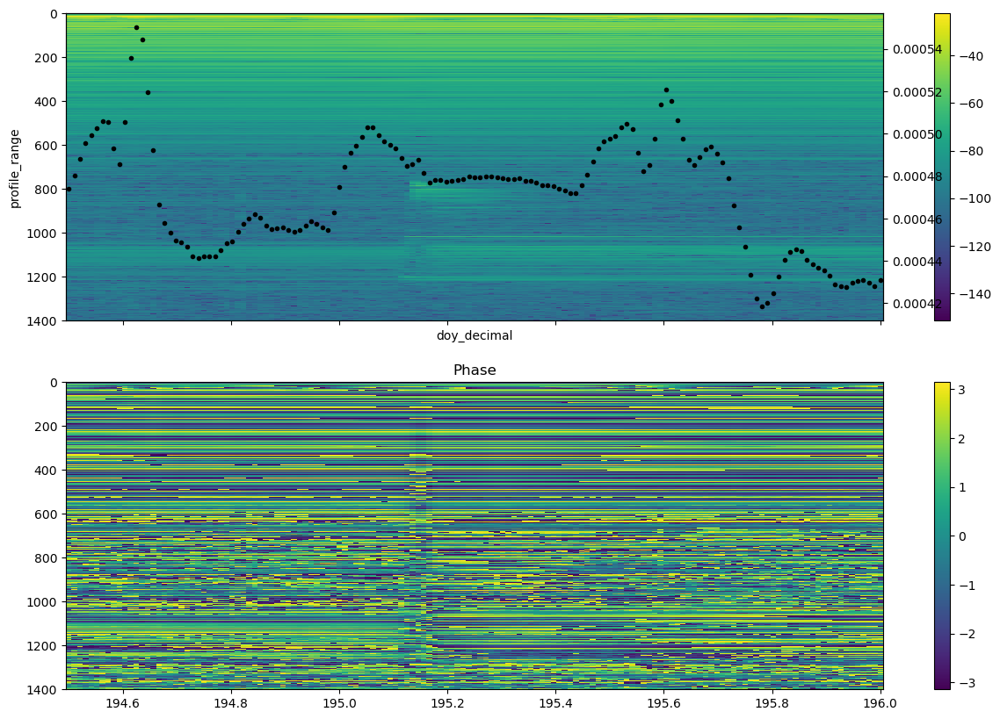

In [27]:
fig, axs = plt.subplots(nrows=2,figsize=(15,10),sharex=True)
fg=xa.dB(interp_profiles).plot(ax=axs[0],x='doy_decimal')
axs[0].invert_yaxis()
ax1 = axs[0].twinx()
abs(interp_profiles).mean(dim='profile_range').plot(ax=ax1,x='doy_decimal',color='k',linestyle='None',marker='.')

phi = -np.angle(interp_profiles).astype(float)
im = axs[1].pcolormesh(interp_profiles.doy_decimal.values,interp_profiles.profile_range.values,phi.T)
axs[1].invert_yaxis()
fig.colorbar(im)
axs[1].set_title('Phase')

In [28]:
count,r2,res = strain_metrics(interp_profiles, 50, 50,4,noise_floor_location)

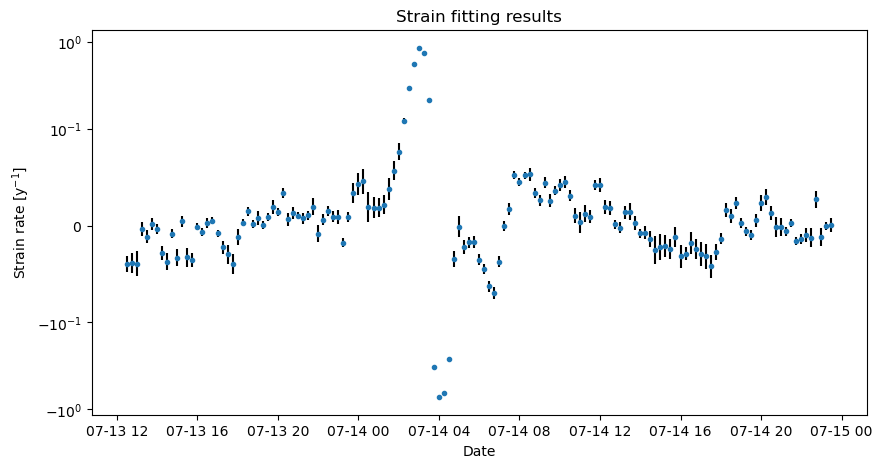

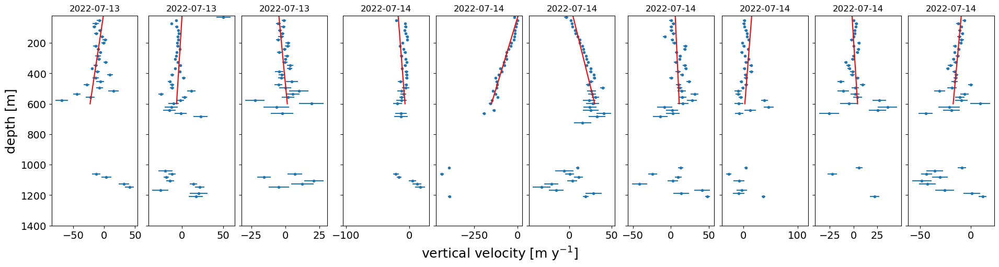

In [29]:
plot_strain_fit(res)

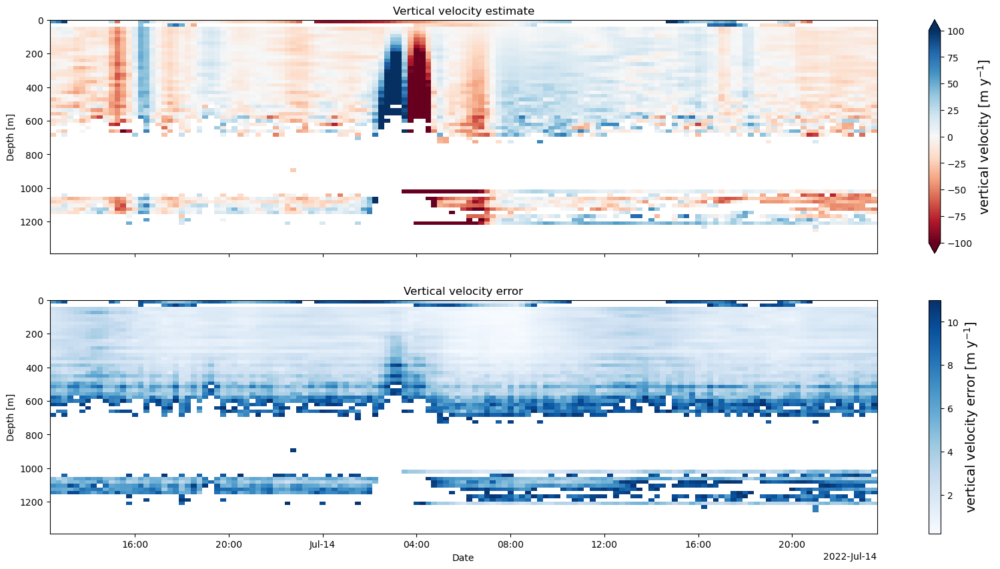

In [30]:
plot_vv_2d(res)

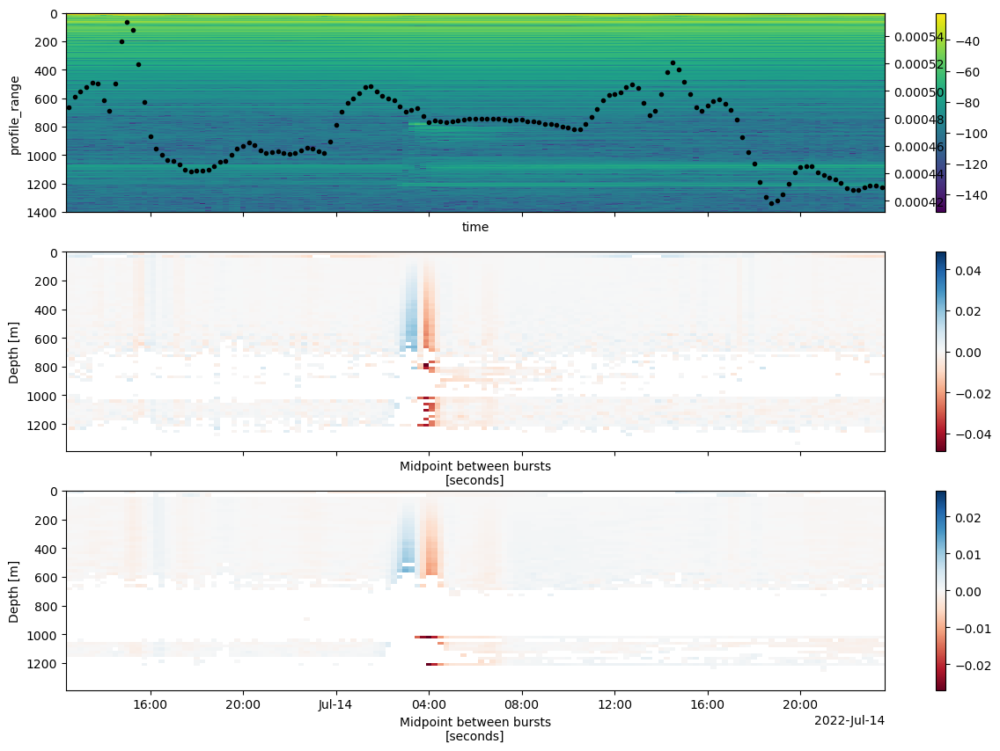

In [56]:
# Look at how this affects displacement estimates
fig, axs = plt.subplots(nrows=3,figsize=(15,10),sharex=True)
xa.dB(interp_profiles).plot(ax=axs[0],x='time')
axs[0].invert_yaxis()
axs[0].set_xlim([194,195])

ax1 = axs[0].twinx()
abs(interp_profiles).mean(dim='profile_range').plot(ax=ax1,x='time',color='k',linestyle='None',marker='.')

windows = [1,4,96]
labels = ['15 minutes','1 hour','1 day']

for i in range(2):
    count,r2,res = strain_metrics(interp_profiles, 50, 50,windows[i],800)
    vv = res[0]*900/31536000
    vv['doy_decimal'] = vv.time.dt.dayofyear + (vv.time.dt.hour / 24) + (vv.time.dt.minute / 1440) + (vv.time.dt.second / 86400)
    vv.plot(ax=axs[1+i],x='time',cmap='RdBu')#,vmin=-100,vmax=100)
    axs[i+1].invert_yaxis()
#plt.xlim([194,195])

In [33]:
ds_11 = reload("A101")
voltage = ds_11.battery_voltage.interp(time=time_to_interp,method='linear').compute()
temp1 = ds_11.temperature_1
true_temp1 = temp1.where(lambda x: x<300, temp1-512).interp(time=time_to_interp,method='linear').compute()

temp2 = ds_11.temperature_2
true_temp2 = temp2.where(lambda x: x<300, temp2-512).interp(time=time_to_interp,method='linear').compute()


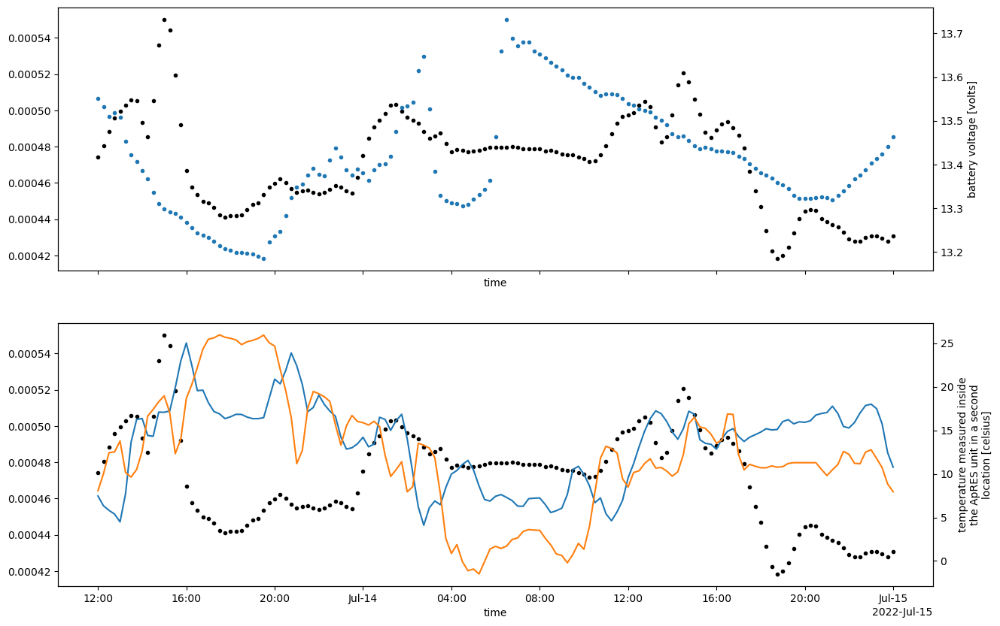

In [34]:
fig, axs = plt.subplots(nrows=2,figsize=(15,10),sharex=True)
abs(interp_profiles).mean(dim='profile_range').plot(ax=axs[0],color='k',linestyle='None',marker='.')
ax1 = axs[0].twinx()
voltage.plot(ax=ax1,linestyle='None',marker='.')

abs(interp_profiles).mean(dim='profile_range').plot(ax=axs[1],color='k',linestyle='None',marker='.')
ax2 = axs[1].twinx()
true_temp1.plot(ax=ax2)
true_temp2.plot(ax=ax2)


In [37]:
chirps = ds_11_drain.isel(attenuator_setting_pair=0).chirp.interp(time=time_to_interp,method='linear').compute()

In [51]:
#chirps.time[48]
chirps.time[80]

<xarray.DataArray 'time' ()> Size: 8B
array('2022-07-14T08:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    AFGain        int64 8B -4
    attenuator    float64 8B 5.0
    burst_number  float64 8B 67.52
    time          datetime64[ns] 8B 2022-07-14T08:00:00
    filename      <U83 332B 'ldeo-glaciology/GL_apres_2022/A101/CardA/DIR2022...
Attributes:
    long_name:  time of burst

In [52]:
80-48

32

Text(0.5, 0, 'chirp time [ns]')

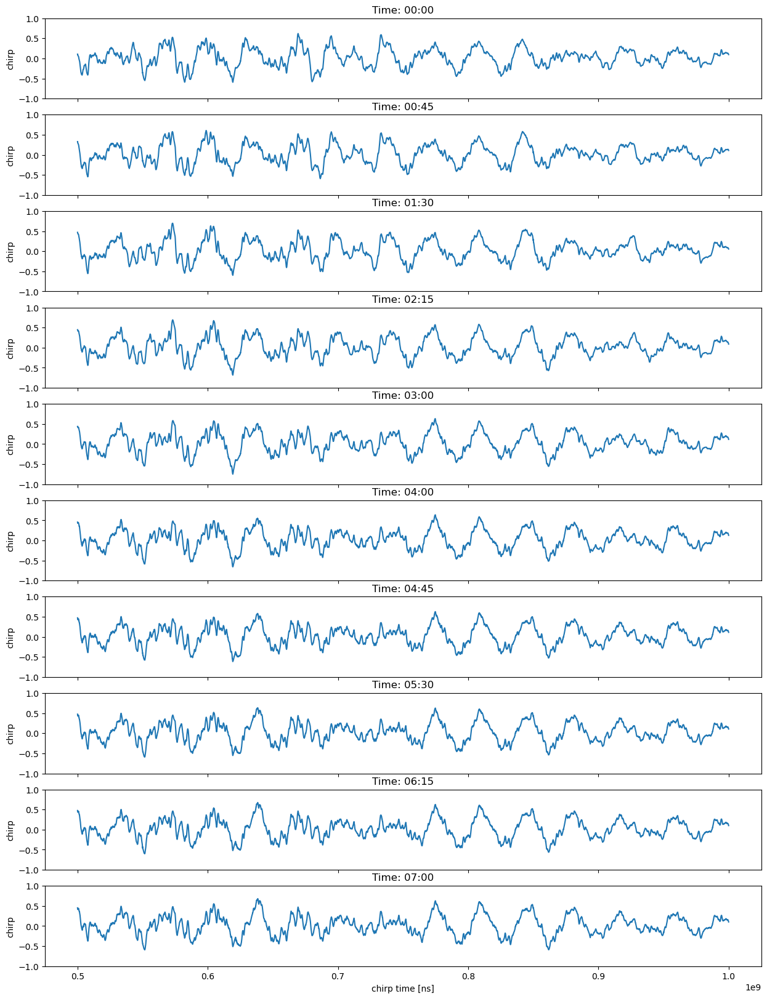

In [55]:
fig, axs = plt.subplots(nrows=10,figsize=(15,20),sharex=True)
for i in range(10):
    chirp = chirps.isel(time= [48 + 32*i//10],chirp_time=range(20000,39998)).mean(dim='chirp_num')
    chirp.plot(ax=axs[i])
    axs[i].set_title(f'Time: {str(chirp.time.values[0])[11:16]}')
    axs[i].set_xlabel('')
    axs[i].set_ylim([-1,1])
axs[-1].set_xlabel('chirp time [ns]')


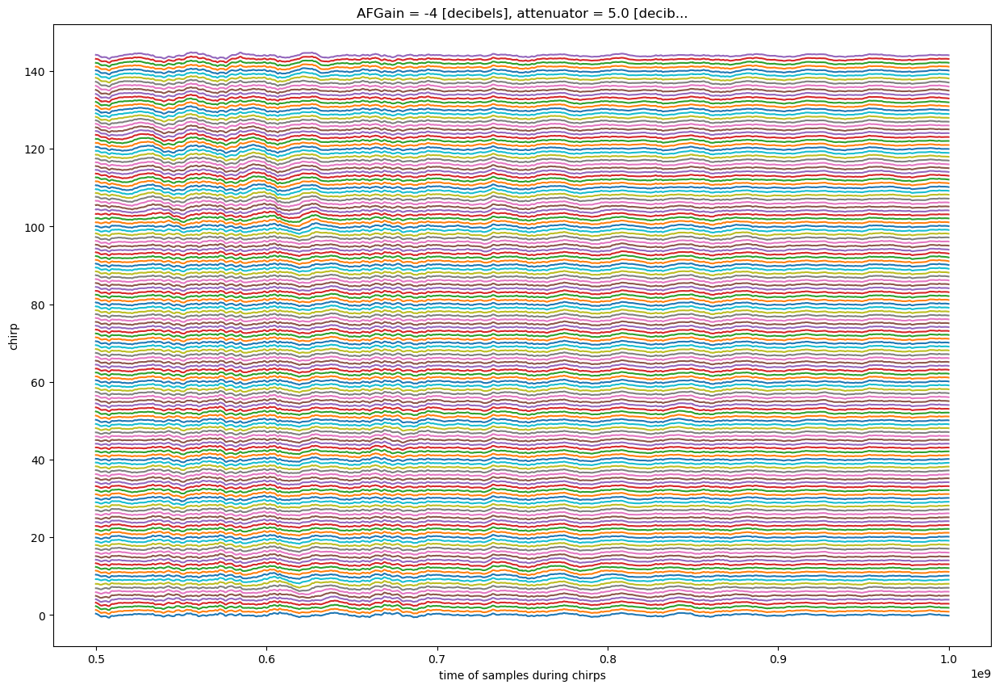

In [69]:
fig, ax = plt.subplots(figsize=(15,10))
for i in range(len(chirps.time)):
    chirp = chirps.isel(time= [i],chirp_time=range(20000,39998)).mean(dim='chirp_num')
    (chirp+i).plot()
    #axs[i].set_title(f'Time: {str(chirp.time.values[0])[:16]}')
    #axs[i].set_xlabel('')
    #axs[i].set_ylim([-1,1])
#axs[-1].set_xlabel('chirp time [ns]')


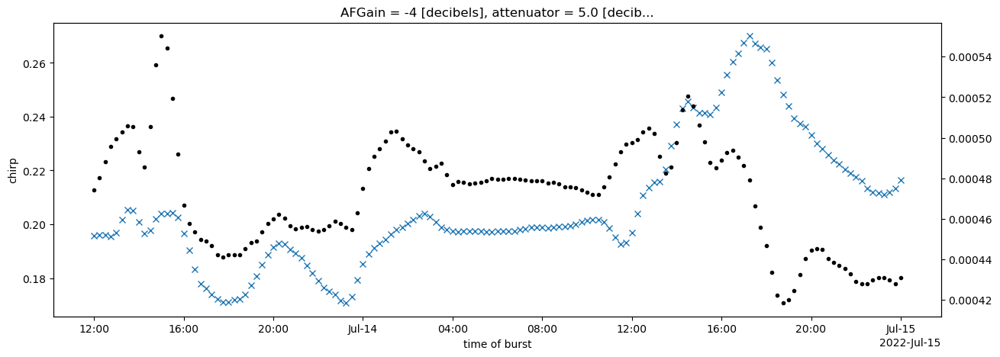

In [58]:
fig, axs = plt.subplots(nrows=1,figsize=(15,5),sharex=True)

abs(chirps.isel(chirp_time=range(20000,39998))).mean(dim=['chirp_time','chirp_num']).plot(ax=axs,linestyle='None',marker='x')
ax1=axs.twinx()
abs(interp_profiles).mean(dim='profile_range').plot(ax=ax1,color='k',linestyle='None',marker='.')


# A13

In [24]:
ds_13_drain = ds_13.isel(time=range(4200,5200))
test = custom_profile(ds_13_drain.isel(attenuator_setting_pair=0).chirp,clip_threshold=1.2,min_chirps = 5,start=30000)
time_to_interp = pd.date_range("2022-07-09 12:00", "2022-07-19 12:00", freq="15min")
interp_profiles = test.interp(time=time_to_interp,method='linear')
interp_profiles['doy_decimal'] = interp_profiles.time.dt.dayofyear + (interp_profiles.time.dt.hour / 24) + (interp_profiles.time.dt.minute / 1440) + (interp_profiles.time.dt.second / 86400)


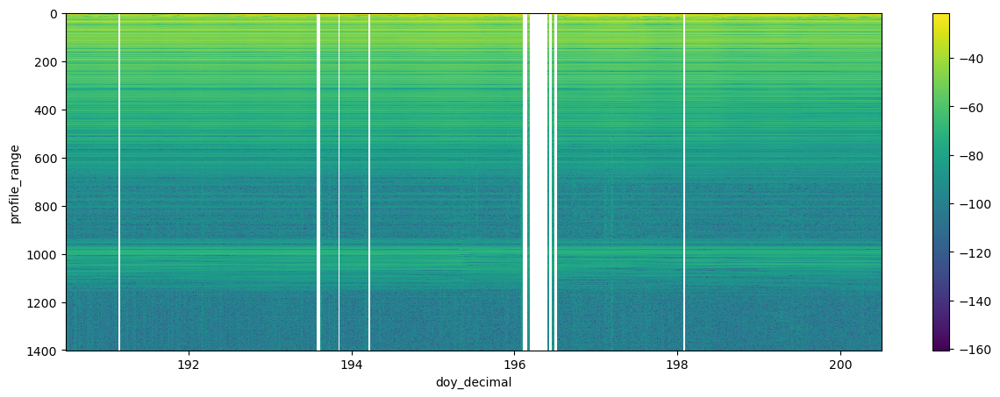

In [25]:
fig, ax = plt.subplots(figsize=(15,5))
xa.dB(interp_profiles).plot(x='doy_decimal')
ax.invert_yaxis()

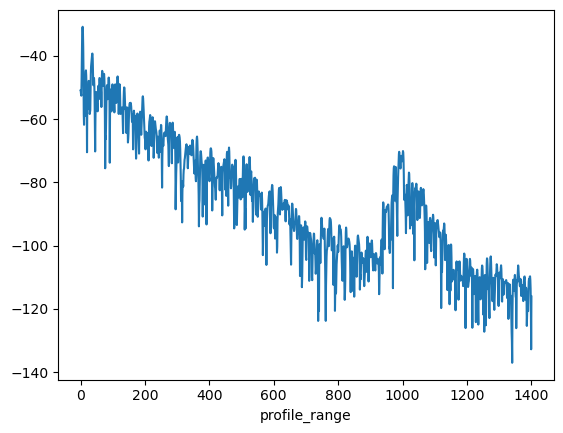

In [26]:
xa.dB(interp_profiles.mean(dim='time')).plot()


In [29]:
noise_floor_location = 800
for i in [20,24,30,40,60,70,80]:
    co_bins = interp_profiles.profile_range[::i].where(interp_profiles.profile_range[::i] <noise_floor_location,drop=True)
    print(f'Bin size of {i} points leads to a total of {len(co_bins)} points in the first {noise_floor_location} m')

Bin size of 20 points leads to a total of 48 points in the first 800 m
Bin size of 24 points leads to a total of 40 points in the first 800 m
Bin size of 30 points leads to a total of 32 points in the first 800 m
Bin size of 40 points leads to a total of 24 points in the first 800 m
Bin size of 60 points leads to a total of 16 points in the first 800 m
Bin size of 70 points leads to a total of 14 points in the first 800 m
Bin size of 80 points leads to a total of 12 points in the first 800 m


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 1 -> frac high co 0.58, r2 0.26


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 2 -> frac high co 0.55, r2 0.35


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 4 -> frac high co 0.54, r2 0.45


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 8 -> frac high co 0.52, r2 0.56


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 24 -> frac high co 0.48, r2 0.74


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 48 -> frac high co 0.44, r2 0.77


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 96 -> frac high co 0.42, r2 0.79


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 192 -> frac high co 0.38, r2 0.88


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 288 -> frac high co 0.34, r2 0.93


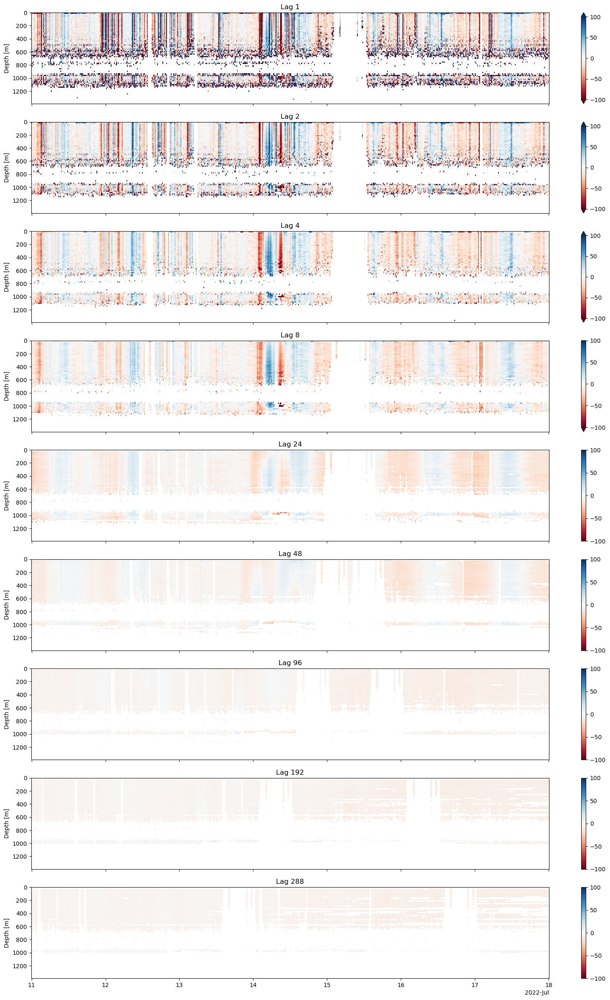

In [30]:
time_lags = [1,2,4,8,24,48,96,192,288] # 15, 30 mins, 1,2,6,12 hours, 1,2,3 days, 1,2 weeks
fig, axs = plt.subplots(figsize=(20,30),nrows=len(time_lags),sharex=True)

for i in range(len(time_lags)):
    count,r2,res = strain_metrics(interp_profiles, 24, 24,time_lags[i],noise_floor_location)
    print(f"Lag {time_lags[i]} -> frac high co {count:.2}, r2 {r2:.2}")
    vv = res[0]
    vv_err = res[1]
    fit=res[2]
    r2 = res[3]
    plt1 = vv.plot(ax=axs[i],x='time',cmap='RdBu',vmin=-100,vmax=100)
    axs[i].invert_yaxis()
    axs[i].set_xlabel('')
    axs[i].set_title(f"Lag {time_lags[i]}")
    #plt1.colorbar.set_label(label='vertical velocity [m y$^{-1}$]', size=14)

In [31]:
count,r2,res = strain_metrics(interp_profiles, 24, 24,4,noise_floor_location)

/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


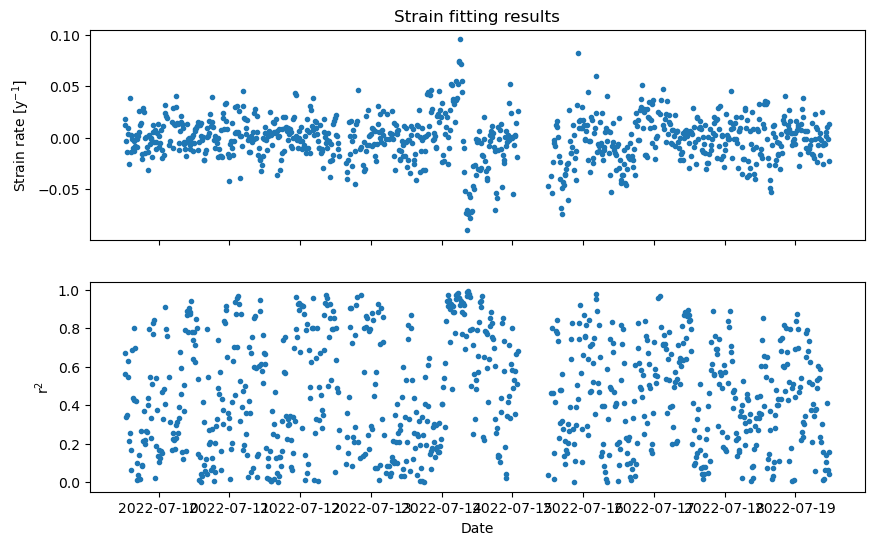

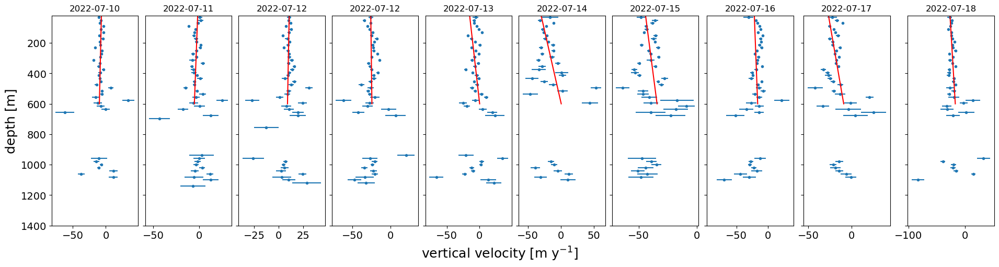

In [32]:
plot_strain_fit(res)

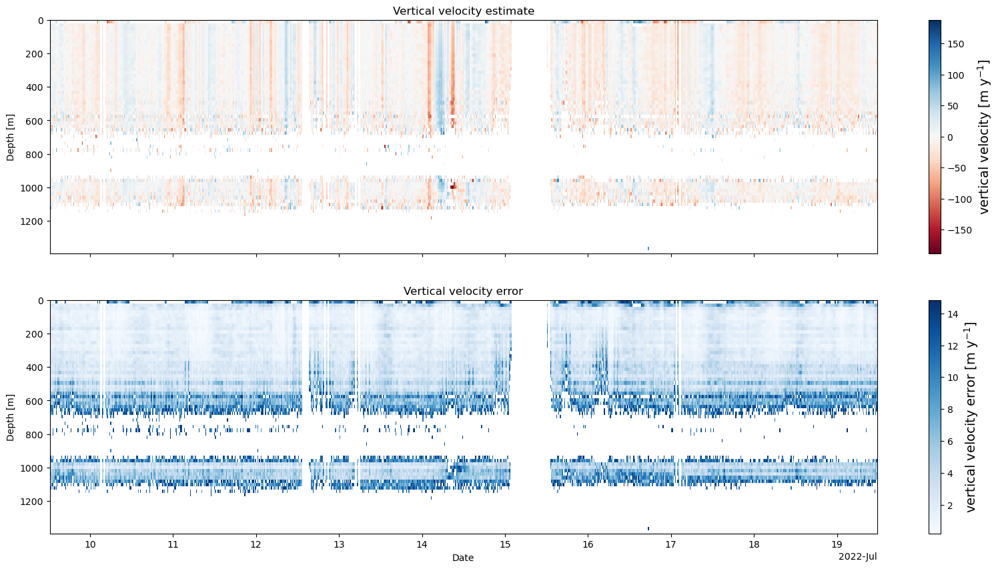

In [33]:
plot_vv_2d(res)

## A14

In [34]:
ds_14_drain = ds_14.isel(time=range(4200,5200))
test = custom_profile(ds_14_drain.isel(attenuator_setting_pair=0).chirp,clip_threshold=1.2,min_chirps = 5,start=4000)
time_to_interp = pd.date_range("2022-07-09 12:00", "2022-07-19 12:00", freq="15min")
interp_profiles = test.interp(time=time_to_interp,method='linear')
interp_profiles['doy_decimal'] = interp_profiles.time.dt.dayofyear + (interp_profiles.time.dt.hour / 24) + (interp_profiles.time.dt.minute / 1440) + (interp_profiles.time.dt.second / 86400)


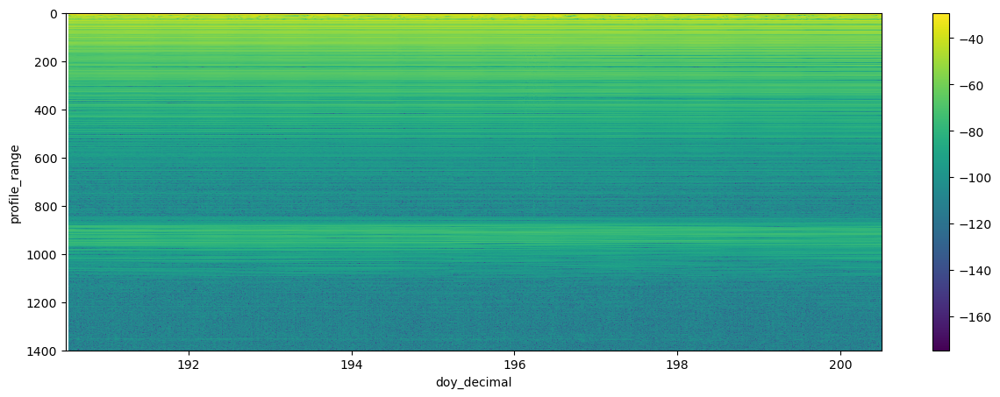

In [35]:
fig, ax = plt.subplots(figsize=(15,5))
xa.dB(interp_profiles).plot(x='doy_decimal')
ax.invert_yaxis()

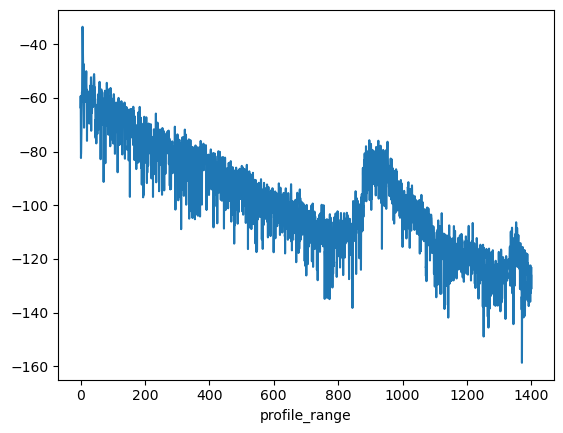

In [36]:
xa.dB(interp_profiles.mean(dim='time')).plot()


In [37]:
noise_floor_location = 800
for i in [20,30,40,60,70,80]:
    co_bins = interp_profiles.profile_range[::i].where(interp_profiles.profile_range[::i] <noise_floor_location,drop=True)
    print(f'Bin size of {i} points leads to a total of {len(co_bins)} points in the first {noise_floor_location} m')

Bin size of 20 points leads to a total of 172 points in the first 800 m
Bin size of 30 points leads to a total of 115 points in the first 800 m
Bin size of 40 points leads to a total of 86 points in the first 800 m
Bin size of 60 points leads to a total of 58 points in the first 800 m
Bin size of 70 points leads to a total of 49 points in the first 800 m
Bin size of 80 points leads to a total of 43 points in the first 800 m


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 1 -> frac high co 0.63, r2 0.22


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 2 -> frac high co 0.59, r2 0.34


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 4 -> frac high co 0.57, r2 0.51


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 8 -> frac high co 0.55, r2 0.69


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 24 -> frac high co 0.52, r2 0.86


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 48 -> frac high co 0.47, r2 0.9


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 96 -> frac high co 0.42, r2 0.89


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 192 -> frac high co 0.36, r2 0.9


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 288 -> frac high co 0.26, r2 0.91


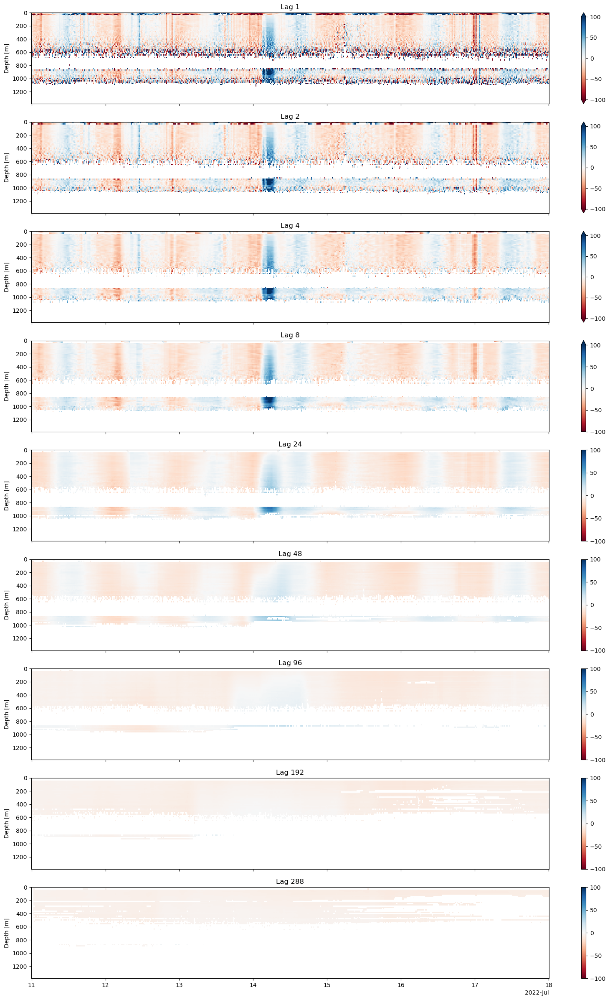

In [38]:
time_lags = [1,2,4,8,24,48,96,192,288] # 15, 30 mins, 1,2,6,12 hours, 1,2,3 days, 1,2 weeks
fig, axs = plt.subplots(figsize=(20,30),nrows=len(time_lags),sharex=True)

for i in range(len(time_lags)):
    count,r2,res = strain_metrics(interp_profiles, 80, 80,time_lags[i],noise_floor_location)
    print(f"Lag {time_lags[i]} -> frac high co {count:.2}, r2 {r2:.2}")
    vv = res[0]
    vv_err = res[1]
    fit=res[2]
    r2 = res[3]
    plt1 = vv.plot(ax=axs[i],x='time',cmap='RdBu',vmin=-100,vmax=100)
    axs[i].invert_yaxis()
    axs[i].set_xlabel('')
    axs[i].set_title(f"Lag {time_lags[i]}")
    #plt1.colorbar.set_label(label='vertical velocity [m y$^{-1}$]', size=14)

In [39]:
count,r2,res = strain_metrics(interp_profiles, 80, 80,4,noise_floor_location)

/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


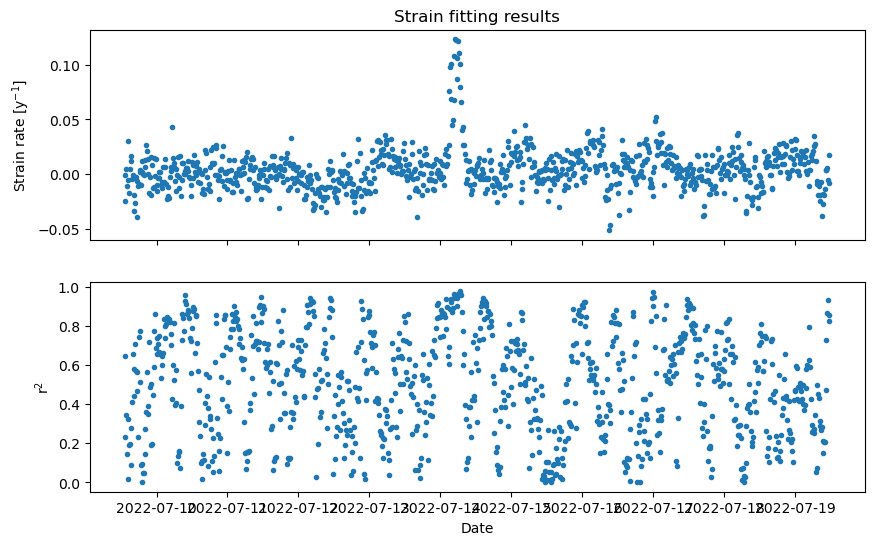

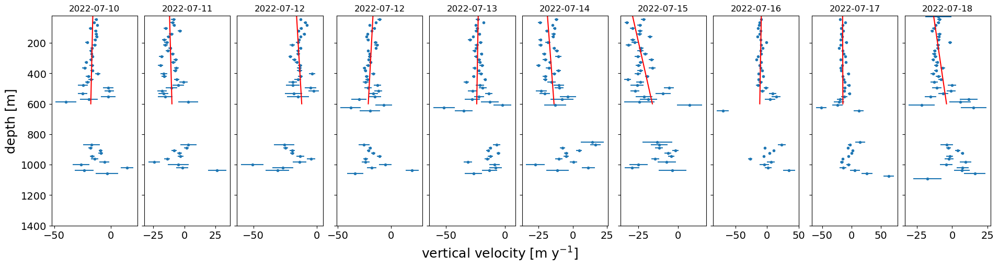

In [40]:
plot_strain_fit(res)

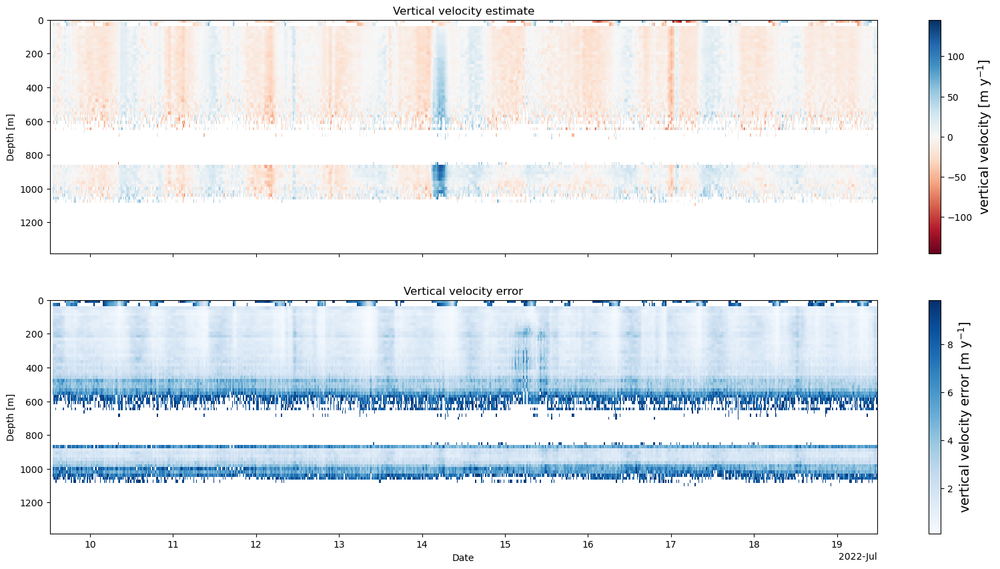

In [41]:
plot_vv_2d(res)